In [1]:
import pandas as pd
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')

In [2]:
train

,num_date_time,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82,0.0,0.00,5794.80
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82,0.0,0.00,5591.85
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80,0.0,0.00,5338.17
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81,0.0,0.00,4554.42
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81,0.0,0.00,3602.25
...,...,...,...,...,...,...,...,...,...,...
203995,100_20240824 19,100,20240824 19,29.1,0.0,4.4,76,0.4,0.18,3276.00
203996,100_20240824 20,100,20240824 20,28.6,0.0,3.7,74,0.0,0.00,3197.52
203997,100_20240824 21,100,20240824 21,28.3,0.0,2.9,74,0.0,0.00,3006.60
203998,100_20240824 22,100,20240824 22,28.0,0.0,1.7,76,0.0,0.00,2649.72


In [3]:
bi

,건물번호,건물유형,연면적(m2),냉방면적(m2),태양광용량(kW),ESS저장용량(kWh),PCS용량(kW)
0,1,호텔,82912.71,77586.00,-,-,-
1,2,상용,40658.90,30392.82,-,-,-
2,3,병원,560431.00,418992.00,278.58,-,-
3,4,호텔,41813.29,23715.71,-,-,-
4,5,학교,403749.39,248507.00,1983.05,1025,250
...,...,...,...,...,...,...,...
95,96,건물기타,3260213.41,1956128.00,-,-,-
96,97,건물기타,42370.93,3975.52,81.38,-,-
97,98,호텔,99102.62,22097.00,-,-,-
98,99,상용,329867.95,13442.35,171.6,-,-


In [5]:
# 건물유형 정보를 train 데이터에 병합
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')


In [6]:
merged_df

,num_date_time,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh),건물유형
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82,0.0,0.00,5794.80,호텔
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82,0.0,0.00,5591.85,호텔
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80,0.0,0.00,5338.17,호텔
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81,0.0,0.00,4554.42,호텔
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81,0.0,0.00,3602.25,호텔
...,...,...,...,...,...,...,...,...,...,...,...
203995,100_20240824 19,100,20240824 19,29.1,0.0,4.4,76,0.4,0.18,3276.00,호텔
203996,100_20240824 20,100,20240824 20,28.6,0.0,3.7,74,0.0,0.00,3197.52,호텔
203997,100_20240824 21,100,20240824 21,28.3,0.0,2.9,74,0.0,0.00,3006.60,호텔
203998,100_20240824 22,100,20240824 22,28.0,0.0,1.7,76,0.0,0.00,2649.72,호텔


In [8]:
unique_types = bi['건물유형'].unique()
print(unique_types)

['호텔' '상용' '병원' '학교' '건물기타' '아파트' '연구소' '백화점' 'IDC(전화국)' '공공']


In [9]:
# 건물유형별 평균 전력소비량 계산
mean_usage_by_type = merged_df.groupby('건물유형')['전력소비량(kWh)'].mean().sort_values(ascending=False)
print(mean_usage_by_type)


건물유형
IDC(전화국)    10316.944618
병원           4454.059004
학교           3462.680492
호텔           3175.016948
백화점          2729.738252
상용           2513.698044
건물기타         2285.963948
연구소          2111.671770
공공           1625.914862
아파트          1106.309105
Name: 전력소비량(kWh), dtype: float64


In [10]:
department_store_df = merged_df[merged_df['건물유형'] == '백화점']

In [11]:
department_store_df

,num_date_time,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh),건물유형
34680,18_20240601 00,18,20240601 00,16.8,0.0,1.6,88,0.0,0.0,497.28,백화점
34681,18_20240601 01,18,20240601 01,16.5,0.7,2.0,92,0.0,0.0,480.24,백화점
34682,18_20240601 02,18,20240601 02,16.8,0.5,2.2,91,0.0,0.0,481.20,백화점
34683,18_20240601 03,18,20240601 03,16.5,0.0,1.5,90,0.0,0.0,475.92,백화점
34684,18_20240601 04,18,20240601 04,16.4,0.0,1.9,90,0.0,0.0,484.08,백화점
...,...,...,...,...,...,...,...,...,...,...,...
193795,95_20240824 19,95,20240824 19,27.4,0.0,0.7,86,0.0,0.0,4143.84,백화점
193796,95_20240824 20,95,20240824 20,26.4,0.0,0.5,91,0.0,0.0,2656.32,백화점
193797,95_20240824 21,95,20240824 21,25.4,0.0,0.3,93,0.0,0.0,1380.96,백화점
193798,95_20240824 22,95,20240824 22,24.8,0.0,0.1,96,0.0,0.0,2196.00,백화점


In [13]:
building_18_df = department_store_df[department_store_df['건물번호'] == 18]

In [16]:
# IQR 방식으로 이상치 구간 계산
Q1 = building_18_df['전력소비량(kWh)'].quantile(0.25)
Q3 = building_18_df['전력소비량(kWh)'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# 이상치 데이터 추출
outliers = building_18_df[
    (building_18_df['전력소비량(kWh)'] < lower_bound) |
    (building_18_df['전력소비량(kWh)'] > upper_bound)
]


In [23]:
import pandas as pd

# 1. 데이터 로드
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')

# 2. 데이터 병합 (건물유형 추가)
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')

# 3. 전력소비량 숫자형으로 변환 (문자열 오류 방지용)
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# 4. 건물유형 == '백화점'만 필터링
department_store_df = merged_df[merged_df['건물유형'] == '백화점'].dropna(subset=['전력소비량(kWh)'])

# 5. 백화점 건물번호 목록
department_store_ids = department_store_df['건물번호'].unique()

# 6. 이상치 누적 저장용
all_outliers = pd.DataFrame()

# 7. 각 건물번호별 이상치 탐지
for bid in department_store_ids:
    df = department_store_df[department_store_df['건물번호'] == bid]
    
    # 전력소비량 기준 IQR 계산
    Q1 = df['전력소비량(kWh)'].quantile(0.25)
    Q3 = df['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    # 이상치 필터링
    outliers = df[(df['전력소비량(kWh)'] < lower) | (df['전력소비량(kWh)'] > upper)]
    
    if not outliers.empty:
        all_outliers = pd.concat([all_outliers, outliers], ignore_index=True)

# 1. 먼저 이상치 결과가 비어 있는지 확인
if all_outliers.empty:
    print("⚠️ 이상치가 없습니다. 모든 백화점 건물의 전력소비량이 정상 범위 내에 있습니다.")
else:
    # 2. 존재하는 열 목록 확인
    print("✅ all_outliers.columns:", all_outliers.columns.tolist())

    # 3. 이상치 건물번호별 개수 출력
    if '건물번호' in all_outliers.columns:
        print("📌 이상치 건물번호별 개수:")
        print(all_outliers['건물번호'].value_counts())

    # 4. 이상치 상위 5개 출력
    print("\n📌 이상치 예시 (상위 5건):")
    print(all_outliers.head())



⚠️ 이상치가 없습니다. 모든 백화점 건물의 전력소비량이 정상 범위 내에 있습니다.


In [24]:
import pandas as pd

# 1. 데이터 로드
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')

# 2. 데이터 병합 (건물유형 추가)
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')

# 3. 전력소비량 숫자형으로 변환 (문자열 오류 방지용)
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# 4. 건물유형 == '백화점'만 필터링
IDC_df = merged_df[merged_df['건물유형'] == 'IDC(전화국)'].dropna(subset=['전력소비량(kWh)'])

# 5. 백화점 건물번호 목록
IDC_df_ids = IDC_df['건물번호'].unique()

# 6. 이상치 누적 저장용
all_outliers = pd.DataFrame()

# 7. 각 건물번호별 이상치 탐지
for bid in IDC_df_ids:
    df = IDC_df[IDC_df['건물번호'] == bid]
    
    # 전력소비량 기준 IQR 계산
    Q1 = df['전력소비량(kWh)'].quantile(0.25)
    Q3 = df['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    # 이상치 필터링
    outliers = df[(df['전력소비량(kWh)'] < lower) | (df['전력소비량(kWh)'] > upper)]
    
    if not outliers.empty:
        all_outliers = pd.concat([all_outliers, outliers], ignore_index=True)

# 1. 먼저 이상치 결과가 비어 있는지 확인
if all_outliers.empty:
    print("⚠️ 이상치가 없습니다. 모든 백화점 건물의 전력소비량이 정상 범위 내에 있습니다.")
else:
    # 2. 존재하는 열 목록 확인
    print("✅ all_outliers.columns:", all_outliers.columns.tolist())

    # 3. 이상치 건물번호별 개수 출력
    if '건물번호' in all_outliers.columns:
        print("📌 이상치 건물번호별 개수:")
        print(all_outliers['건물번호'].value_counts())

    # 4. 이상치 상위 5개 출력
    print("\n📌 이상치 예시 (상위 5건):")
    print(all_outliers.head())



✅ all_outliers.columns: ['num_date_time', '건물번호', '일시', '기온(°C)', '강수량(mm)', '풍속(m/s)', '습도(%)', '일조(hr)', '일사(MJ/m2)', '전력소비량(kWh)', '건물유형']
📌 이상치 건물번호별 개수:
건물번호
52    177
64    165
81     74
30     56
67     52
43     19
36     12
Name: count, dtype: int64

📌 이상치 예시 (상위 5건):
    num_date_time  건물번호           일시  기온(°C)  강수량(mm)  풍속(m/s)  습도(%)  일조(hr)  \
0  30_20240713 20    30  20240713 20    26.7      0.0      1.9     75     0.0   
1  30_20240725 00    30  20240725 00    25.8      0.0      1.4     95     0.0   
2  30_20240801 15    30  20240801 15    33.3      0.0      2.9     62     0.9   
3  30_20240801 16    30  20240801 16    32.6      0.0      3.5     64     0.8   
4  30_20240801 19    30  20240801 19    30.5      0.0      2.4     73     0.0   

   일사(MJ/m2)  전력소비량(kWh)      건물유형  
0       0.11     2444.40  IDC(전화국)  
1       0.00     7374.24  IDC(전화국)  
2       2.85    10384.56  IDC(전화국)  
3       2.13    10345.68  IDC(전화국)  
4       0.31    10416.24  IDC(전화국)  


In [28]:
for bid, group in IDC_df.groupby('건물번호'):
    print(bid)

30
35
36
43
52
57
64
67
81


In [3]:
import os, re, zipfile
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import font_manager as fm

# ---------- 0) Korean font (best-effort) ----------
installed = {f.name for f in fm.fontManager.ttflist}
for name in ["NanumGothic", "Malgun Gothic", "AppleGothic",
             "Noto Sans CJK KR", "Noto Sans CJK", "NotoSansKR-Regular"]:
    if name in installed:
        mpl.rcParams["font.family"] = name
        break
mpl.rcParams["axes.unicode_minus"] = False

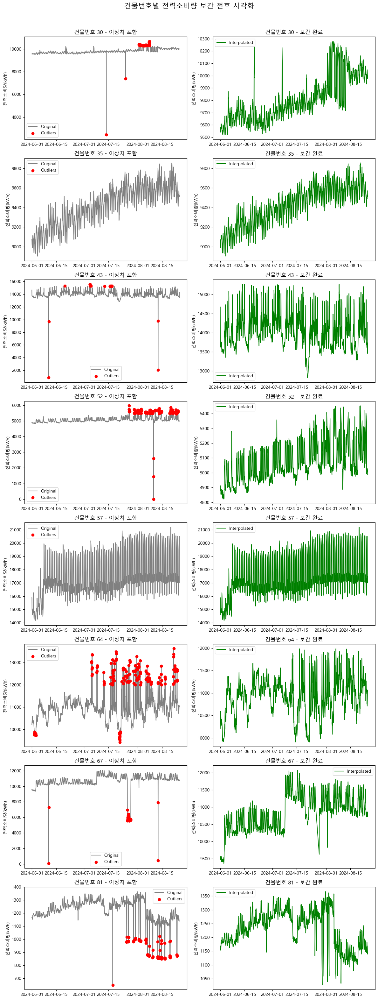

📌 건물번호별 이상치 개수
건물번호 30: 56개
건물번호 35: 0개
건물번호 36: 12개
건물번호 43: 19개
건물번호 52: 177개
건물번호 57: 0개
건물번호 64: 165개
건물번호 67: 52개
건물번호 81: 74개


In [33]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 데이터 로드 및 병합
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# 2. IDC 건물만 필터링 및 datetime 변환
IDC_df = merged_df[merged_df['건물유형'] == 'IDC(전화국)'].copy()
IDC_df['일시'] = pd.to_datetime(IDC_df['일시'], format='%Y%m%d %H', errors='coerce')

# 3. 건물번호별 보간 처리 및 이상치 기록
cleaned_dfs = []
outlier_counts = {}

for bid, group in IDC_df.groupby('건물번호'):
    group = group.sort_values('일시')

    Q1 = group['전력소비량(kWh)'].quantile(0.25)
    Q3 = group['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    is_outlier = (group['전력소비량(kWh)'] < lower) | (group['전력소비량(kWh)'] > upper)
    outlier_counts[bid] = is_outlier.sum()

    group.loc[is_outlier, '전력소비량(kWh)'] = pd.NA
    group['전력소비량(kWh)'] = group['전력소비량(kWh)'].interpolate(method='linear')
    group['전력소비량(kWh)'] = group['전력소비량(kWh)'].ffill().bfill()
    cleaned_dfs.append(group)

cleaned_IDC_df = pd.concat(cleaned_dfs).sort_values(['건물번호', '일시'])

# 4. 시각화 (샘플 3개)
sample_buildings = [30,35,43,52,57,64,67,81]
fig, axes = plt.subplots(len(sample_buildings), 2, figsize=(12, 4 * len(sample_buildings)))
fig.suptitle("건물번호별 전력소비량 보간 전후 시각화", fontsize=16)

for i, bid in enumerate(sample_buildings):
    original = IDC_df[IDC_df['건물번호'] == bid].sort_values('일시')
    cleaned = cleaned_IDC_df[cleaned_IDC_df['건물번호'] == bid].sort_values('일시')

    Q1 = original['전력소비량(kWh)'].quantile(0.25)
    Q3 = original['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    is_outlier = (original['전력소비량(kWh)'] < lower) | (original['전력소비량(kWh)'] > upper)

    # 좌: 원본 이상치 포함
    axes[i, 0].plot(original['일시'], original['전력소비량(kWh)'], label='Original', color='gray')
    axes[i, 0].scatter(original['일시'][is_outlier], original['전력소비량(kWh)'][is_outlier],
                       color='red', label='Outliers', zorder=3)
    axes[i, 0].set_title(f"건물번호 {bid} - 이상치 포함")
    axes[i, 0].set_ylabel("전력소비량(kWh)")
    axes[i, 0].legend()

    # 우: 보간 후
    axes[i, 1].plot(cleaned['일시'], cleaned['전력소비량(kWh)'], color='green', label='Interpolated')
    axes[i, 1].set_title(f"건물번호 {bid} - 보간 완료")
    axes[i, 1].set_ylabel("전력소비량(kWh)")
    axes[i, 1].legend()

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# 5. 이상치 개수 출력
print("📌 건물번호별 이상치 개수")
for bid, count in outlier_counts.items():
    print(f"건물번호 {bid}: {count}개")


c:\Users\MYNOTE\anaconda3\Lib\site-packages\pandas\core\missing.py:604: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  terp = interpolate.UnivariateSpline(x, y, k=order, **kwargs)


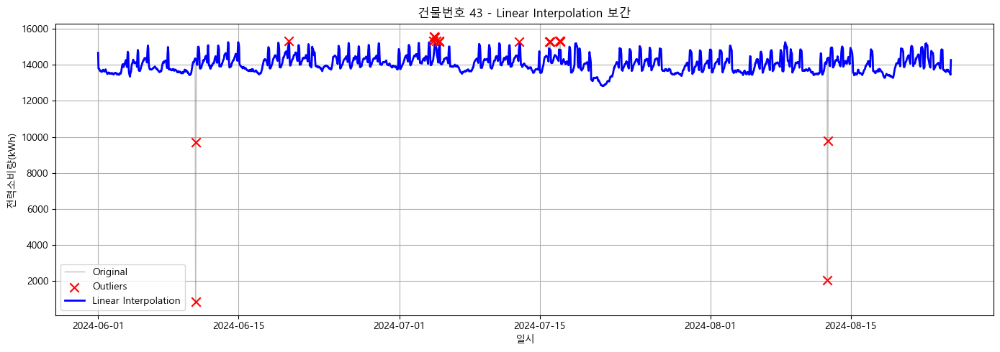

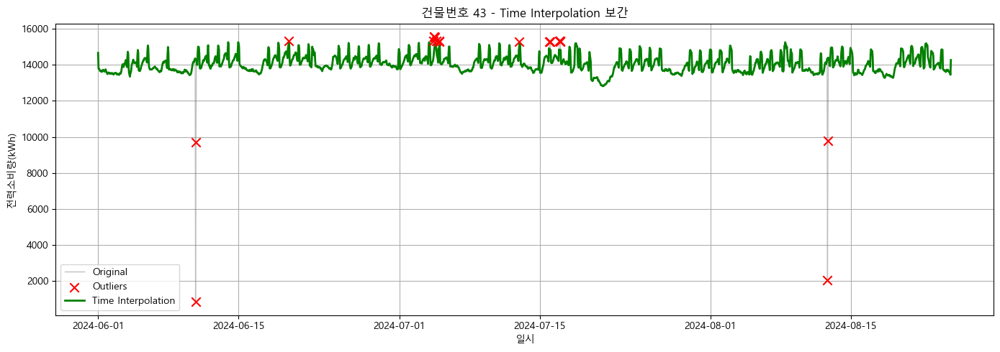

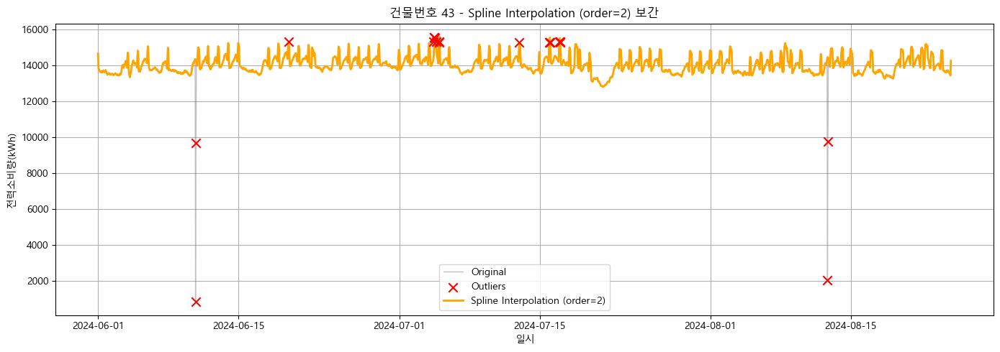

In [38]:
# 업로드된 파일 경로로 데이터 로드
train = pd.read_csv("dataset/train.csv")
bi = pd.read_csv("dataset/building_info.csv")

# 병합 및 전처리
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# IDC만 추출 및 시계열 변환
IDC_df = merged_df[merged_df['건물유형'] == 'IDC(전화국)'].copy()
IDC_df['일시'] = pd.to_datetime(IDC_df['일시'], format='%Y%m%d %H', errors='coerce')

# 건물번호 43 추출 및 이상치 탐지
building_43 = IDC_df[IDC_df['건물번호'] == 43].sort_values('일시').copy()
Q1 = building_43['전력소비량(kWh)'].quantile(0.25)
Q3 = building_43['전력소비량(kWh)'].quantile(0.75)
IQR = Q3 - Q1
lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
outlier_mask = (building_43['전력소비량(kWh)'] < lower) | (building_43['전력소비량(kWh)'] > upper)

# 이상치 마스킹
masked = building_43.copy()
masked.loc[outlier_mask, '전력소비량(kWh)'] = pd.NA

# 보간법별 적용
linear_filled = masked.copy()
linear_filled['전력소비량(kWh)'] = linear_filled['전력소비량(kWh)'].interpolate(method='linear')

time_filled = masked.set_index('일시')
time_filled['전력소비량(kWh)'] = time_filled['전력소비량(kWh)'].interpolate(method='time')
time_filled = time_filled.reset_index()

spline_filled = masked.copy()
spline_filled['전력소비량(kWh)'] = spline_filled['전력소비량(kWh)'].interpolate(method='spline', order=2)

# 시각화 함수 정의
import matplotlib.pyplot as plt

def plot_interpolation(df, title, color):
    plt.figure(figsize=(14, 5))
    plt.plot(building_43['일시'], building_43['전력소비량(kWh)'], label='Original', color='gray', linewidth=1, alpha=0.5)
    plt.scatter(building_43['일시'][outlier_mask], building_43['전력소비량(kWh)'][outlier_mask],
                color='red', label='Outliers', marker='x', s=80, zorder=3)
    plt.plot(df['일시'], df['전력소비량(kWh)'], label=title, color=color, linewidth=2)
    plt.title(f"건물번호 43 - {title} 보간")
    plt.xlabel("일시")
    plt.ylabel("전력소비량(kWh)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 보간별 시각화 개별 출력
plot_interpolation(linear_filled, "Linear Interpolation", "blue")
plot_interpolation(time_filled, "Time Interpolation", "green")
plot_interpolation(spline_filled, "Spline Interpolation (order=2)", "orange")


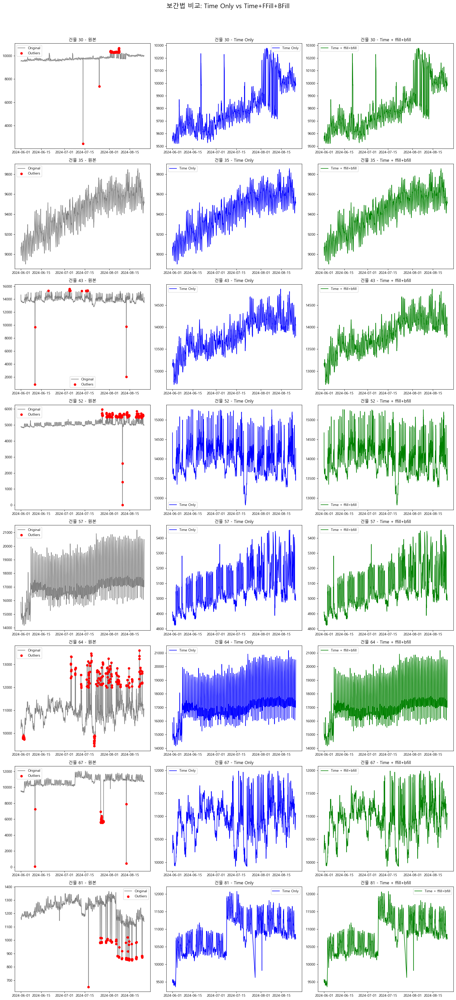

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 데이터 로드 및 병합
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# 2. IDC 건물 필터 및 datetime 변환
IDC_df = merged_df[merged_df['건물유형'] == 'IDC(전화국)'].copy()
IDC_df['일시'] = pd.to_datetime(IDC_df['일시'], format='%Y%m%d %H', errors='coerce')

# 3. 비교 대상 건물 선택
sample_buildings = [30, 35, 43, 52, 57, 64, 67, 81]

# 4. 보간 처리
time_only_dfs = []
time_ffill_dfs = []

for bid, group in IDC_df.groupby('건물번호'):
    group = group.sort_values('일시').set_index('일시')

    # 이상치 마스킹
    Q1 = group['전력소비량(kWh)'].quantile(0.25)
    Q3 = group['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    is_outlier = (group['전력소비량(kWh)'] < lower) | (group['전력소비량(kWh)'] > upper)
    group.loc[is_outlier, '전력소비량(kWh)'] = pd.NA

    # (A) 시간 기반 보간만
    A = group.copy()
    A['전력소비량(kWh)'] = A['전력소비량(kWh)'].interpolate(method='time')
    A = A.reset_index()
    time_only_dfs.append(A)

    # (B) 시간 기반 보간 + ffill + bfill
    B = group.copy()
    B['전력소비량(kWh)'] = B['전력소비량(kWh)'].interpolate(method='time').ffill().bfill()
    B = B.reset_index()
    time_ffill_dfs.append(B)

# 5. 시각화 비교 (3 x 3 = 원본, time만, time+ffill)
fig, axes = plt.subplots(len(sample_buildings), 3, figsize=(18, 5 * len(sample_buildings)))
fig.suptitle("보간법 비교: Time Only vs Time+FFill+BFill", fontsize=18)

for i, bid in enumerate(sample_buildings):
    original = IDC_df[IDC_df['건물번호'] == bid].sort_values('일시')
    time_only = time_only_dfs[i].sort_values('일시')
    time_ffill = time_ffill_dfs[i].sort_values('일시')

    # 이상치 마스크
    Q1 = original['전력소비량(kWh)'].quantile(0.25)
    Q3 = original['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    is_outlier = (original['전력소비량(kWh)'] < lower) | (original['전력소비량(kWh)'] > upper)

    # 1. 원본
    axes[i, 0].plot(original['일시'], original['전력소비량(kWh)'], label='Original', color='gray')
    axes[i, 0].scatter(original['일시'][is_outlier], original['전력소비량(kWh)'][is_outlier],
                       color='red', label='Outliers', zorder=3)
    axes[i, 0].set_title(f"건물 {bid} - 원본")
    axes[i, 0].legend()

    # 2. Time Only
    axes[i, 1].plot(time_only['일시'], time_only['전력소비량(kWh)'], color='blue', label='Time Only')
    axes[i, 1].set_title(f"건물 {bid} - Time Only")
    axes[i, 1].legend()

    # 3. Time + ffill + bfill
    axes[i, 2].plot(time_ffill['일시'], time_ffill['전력소비량(kWh)'], color='green', label='Time + ffill+bfill')
    axes[i, 2].set_title(f"건물 {bid} - Time + ffill+bfill")
    axes[i, 2].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


# IDC(전화국)

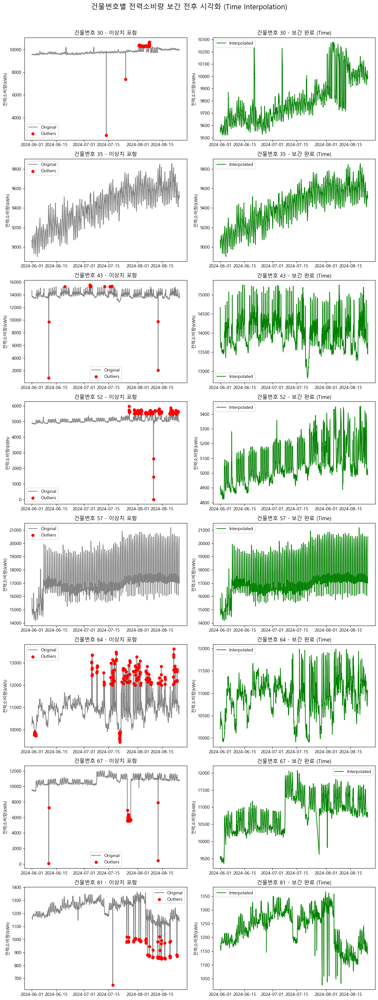

📌 건물번호별 이상치 개수
건물번호 30: 56개
건물번호 35: 0개
건물번호 36: 12개
건물번호 43: 19개
건물번호 52: 177개
건물번호 57: 0개
건물번호 64: 165개
건물번호 67: 52개
건물번호 81: 74개


In [48]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 데이터 로드 및 병합
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# 2. IDC 건물만 필터링 및 datetime 변환
IDC_df = merged_df[merged_df['건물유형'] == 'IDC(전화국)'].copy()
IDC_df['일시'] = pd.to_datetime(IDC_df['일시'], format='%Y%m%d %H', errors='coerce')

# 3. 건물번호별 보간 처리 및 이상치 기록
cleaned_dfs = []
outlier_counts = {}

for bid, group in IDC_df.groupby('건물번호'):
    group = group.sort_values('일시').set_index('일시')  # << 필수: 시간 기반 보간 위해 인덱스 설정

    Q1 = group['전력소비량(kWh)'].quantile(0.25)
    Q3 = group['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    is_outlier = (group['전력소비량(kWh)'] < lower) | (group['전력소비량(kWh)'] > upper)
    outlier_counts[bid] = is_outlier.sum()

    group.loc[is_outlier, '전력소비량(kWh)'] = pd.NA
    group['전력소비량(kWh)'] = group['전력소비량(kWh)'].interpolate(method='time')
    group['전력소비량(kWh)'] = group['전력소비량(kWh)'].ffill().bfill()

    group = group.reset_index()  # 다시 '일시'를 컬럼으로 복원
    cleaned_dfs.append(group)

cleaned_IDC_df = pd.concat(cleaned_dfs).sort_values(['건물번호', '일시'])

# 4. 시각화
sample_buildings = [30, 35, 43, 52, 57, 64, 67, 81]
fig, axes = plt.subplots(len(sample_buildings), 2, figsize=(12, 4 * len(sample_buildings)))
fig.suptitle("건물번호별 전력소비량 보간 전후 시각화 (Time Interpolation)", fontsize=16)

for i, bid in enumerate(sample_buildings):
    original = IDC_df[IDC_df['건물번호'] == bid].sort_values('일시')
    cleaned = cleaned_IDC_df[cleaned_IDC_df['건물번호'] == bid].sort_values('일시')

    Q1 = original['전력소비량(kWh)'].quantile(0.25)
    Q3 = original['전력소비량(kWh)'].quantile(0.75)
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    is_outlier = (original['전력소비량(kWh)'] < lower) | (original['전력소비량(kWh)'] > upper)

    # 좌: 원본 이상치 포함
    axes[i, 0].plot(original['일시'], original['전력소비량(kWh)'], label='Original', color='gray')
    axes[i, 0].scatter(original['일시'][is_outlier], original['전력소비량(kWh)'][is_outlier],
                       color='red', label='Outliers', zorder=3)
    axes[i, 0].set_title(f"건물번호 {bid} - 이상치 포함")
    axes[i, 0].set_ylabel("전력소비량(kWh)")
    axes[i, 0].legend()

    # 우: 보간 후
    axes[i, 1].plot(cleaned['일시'], cleaned['전력소비량(kWh)'], color='green', label='Interpolated')
    axes[i, 1].set_title(f"건물번호 {bid} - 보간 완료 (Time)")
    axes[i, 1].set_ylabel("전력소비량(kWh)")
    axes[i, 1].legend()

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# 5. 이상치 개수 출력
print("📌 건물번호별 이상치 개수")
for bid, count in outlier_counts.items():
    print(f"건물번호 {bid}: {count}개")


In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def interpolate_all_building_types(merged_df, method='time', use_ffill_bfill=True):
    cleaned_all_dfs = []
    outlier_counts = {}

    merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')
    merged_df['일시'] = pd.to_datetime(merged_df['일시'], format='%Y%m%d %H', errors='coerce')

    for btype, group_type in merged_df.groupby('건물유형'):
        for bid, group in group_type.groupby('건물번호'):
            group = group.sort_values('일시').set_index('일시')

            Q1 = group['전력소비량(kWh)'].quantile(0.25)
            Q3 = group['전력소비량(kWh)'].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR

            is_outlier = (group['전력소비량(kWh)'] < lower) | (group['전력소비량(kWh)'] > upper)
            outlier_counts[(btype, bid)] = is_outlier.sum()

            group.loc[is_outlier, '전력소비량(kWh)'] = pd.NA

            # 보간
            try:
                group['전력소비량(kWh)'] = group['전력소비량(kWh)'].interpolate(method=method)
            except Exception as e:
                print(f"❗ 건물유형: {btype}, 건물번호: {bid} - 보간 오류: {e}")
                continue

            if use_ffill_bfill:
                group['전력소비량(kWh)'] = group['전력소비량(kWh)'].ffill().bfill()

            group = group.reset_index()
            cleaned_all_dfs.append(group)

    final_df = pd.concat(cleaned_all_dfs).sort_values(['건물유형', '건물번호', '일시'])
    return final_df, outlier_counts


In [53]:
# 병합 데이터 준비
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')

# 보간 실행: 스플라인 방식 + ffill/bfill 사용
cleaned_df, outlier_count_dict = interpolate_all_building_types(
    merged_df, 
    method='time', 
    use_ffill_bfill=True
)

# 이상치 개수 확인
for (btype, bid), count in outlier_count_dict.items():
    print(f"{btype} - 건물번호 {bid}: 이상치 {count}개")


IDC(전화국) - 건물번호 30: 이상치 56개
IDC(전화국) - 건물번호 35: 이상치 0개
IDC(전화국) - 건물번호 36: 이상치 12개
IDC(전화국) - 건물번호 43: 이상치 19개
IDC(전화국) - 건물번호 52: 이상치 177개
IDC(전화국) - 건물번호 57: 이상치 0개
IDC(전화국) - 건물번호 64: 이상치 165개
IDC(전화국) - 건물번호 67: 이상치 52개
IDC(전화국) - 건물번호 81: 이상치 74개
건물기타 - 건물번호 7: 이상치 0개
건물기타 - 건물번호 26: 이상치 0개
건물기타 - 건물번호 47: 이상치 0개
건물기타 - 건물번호 58: 이상치 0개
건물기타 - 건물번호 61: 이상치 0개
건물기타 - 건물번호 69: 이상치 0개
건물기타 - 건물번호 78: 이상치 1개
건물기타 - 건물번호 82: 이상치 0개
건물기타 - 건물번호 96: 이상치 16개
건물기타 - 건물번호 97: 이상치 1개
공공 - 건물번호 33: 이상치 0개
공공 - 건물번호 38: 이상치 0개
공공 - 건물번호 50: 이상치 0개
공공 - 건물번호 66: 이상치 0개
공공 - 건물번호 68: 이상치 0개
공공 - 건물번호 72: 이상치 2개
공공 - 건물번호 80: 이상치 10개
공공 - 건물번호 92: 이상치 0개
백화점 - 건물번호 18: 이상치 0개
백화점 - 건물번호 19: 이상치 0개
백화점 - 건물번호 27: 이상치 0개
백화점 - 건물번호 29: 이상치 0개
백화점 - 건물번호 32: 이상치 0개
백화점 - 건물번호 34: 이상치 0개
백화점 - 건물번호 40: 이상치 0개
백화점 - 건물번호 45: 이상치 0개
백화점 - 건물번호 54: 이상치 0개
백화점 - 건물번호 59: 이상치 0개
백화점 - 건물번호 63: 이상치 0개
백화점 - 건물번호 73: 이상치 0개
백화점 - 건물번호 74: 이상치 0개
백화점 - 건물번호 79: 이상치 0개
백화점 - 건물번호 88: 이상치 0개
백화점 - 건물번호 95: 이상치 

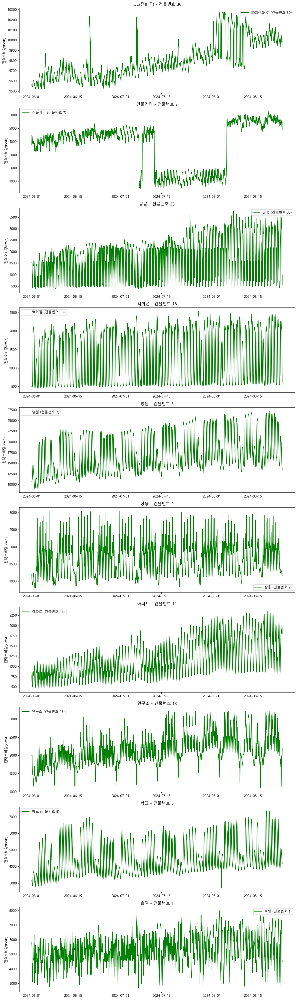

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# CSV 파일 로드
train = pd.read_csv("dataset/train.csv")
bi = pd.read_csv("dataset/building_info.csv")

# 데이터 병합 및 전처리
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')
merged_df['일시'] = pd.to_datetime(merged_df['일시'], format='%Y%m%d %H', errors='coerce')

# 보간 함수 정의
def interpolate_all_building_types(merged_df, method='time', use_ffill_bfill=True):
    cleaned_all_dfs = []
    outlier_counts = {}

    for btype, group_type in merged_df.groupby('건물유형'):
        for bid, group in group_type.groupby('건물번호'):
            group = group.sort_values('일시').set_index('일시')

            Q1 = group['전력소비량(kWh)'].quantile(0.25)
            Q3 = group['전력소비량(kWh)'].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR

            is_outlier = (group['전력소비량(kWh)'] < lower) | (group['전력소비량(kWh)'] > upper)
            outlier_counts[(btype, bid)] = is_outlier.sum()

            group.loc[is_outlier, '전력소비량(kWh)'] = pd.NA

            try:
                group['전력소비량(kWh)'] = group['전력소비량(kWh)'].interpolate(method=method)
            except Exception:
                continue

            if use_ffill_bfill:
                group['전력소비량(kWh)'] = group['전력소비량(kWh)'].ffill().bfill()

            group = group.reset_index()
            cleaned_all_dfs.append(group)

    final_df = pd.concat(cleaned_all_dfs).sort_values(['건물유형', '건물번호', '일시'])
    return final_df, outlier_counts

# 보간 적용
cleaned_df, outlier_counts = interpolate_all_building_types(merged_df)

# 건물유형별 시각화 (샘플 1개씩)
sample = cleaned_df.groupby("건물유형")["건물번호"].unique().apply(lambda x: x[0])
sample_plot_data = []

for btype, bid in sample.items():
    subset = cleaned_df[(cleaned_df['건물유형'] == btype) & (cleaned_df['건물번호'] == bid)]
    sample_plot_data.append((btype, bid, subset))

# 시각화
fig, axes = plt.subplots(len(sample_plot_data), 1, figsize=(12, 4 * len(sample_plot_data)))
if len(sample_plot_data) == 1:
    axes = [axes]

for i, (btype, bid, df) in enumerate(sample_plot_data):
    axes[i].plot(df['일시'], df['전력소비량(kWh)'], label=f'{btype} (건물번호 {bid})', color='green')
    axes[i].set_title(f'{btype} - 건물번호 {bid}')
    axes[i].set_ylabel('전력소비량(kWh)')
    axes[i].legend()

plt.tight_layout()
plt.show()



# 예: 보간된 최종 데이터프레임 이름이 cleaned_all_df 또는 final_df일 경우
cleaned_df.to_csv("interpolated_dataset.csv", index=False, encoding='utf-8-sig')


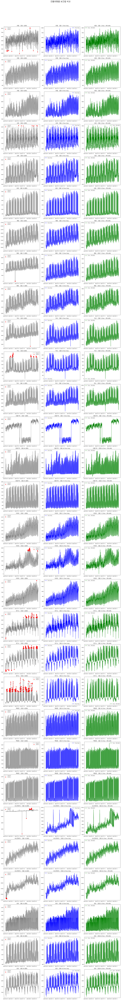

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. 데이터 로드 및 병합
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')

# 2. 날짜 datetime 변환
merged_df['일시'] = pd.to_datetime(merged_df['일시'], format='%Y%m%d %H', errors='coerce')

# 3. 건물유형별 보간
building_types = merged_df['건물유형'].dropna().unique()
all_time_only_dfs = {}
all_time_ffill_dfs = {}

for btype in building_types:
    type_df = merged_df[merged_df['건물유형'] == btype].copy()
    time_only_dfs = []
    time_ffill_dfs = []

    for bid, group in type_df.groupby('건물번호'):
        group = group.sort_values('일시').set_index('일시')

        # 이상치 마스킹
        Q1 = group['전력소비량(kWh)'].quantile(0.25)
        Q3 = group['전력소비량(kWh)'].quantile(0.75)
        IQR = Q3 - Q1
        lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        is_outlier = (group['전력소비량(kWh)'] < lower) | (group['전력소비량(kWh)'] > upper)
        group.loc[is_outlier, '전력소비량(kWh)'] = pd.NA

        # (A) 시간 기반 보간만
        A = group.copy()
        A['전력소비량(kWh)'] = A['전력소비량(kWh)'].interpolate(method='time')
        A = A.reset_index()
        time_only_dfs.append(A)

        # (B) 시간 기반 보간 + ffill + bfill
        B = group.copy()
        B['전력소비량(kWh)'] = B['전력소비량(kWh)'].interpolate(method='time').ffill().bfill()
        B = B.reset_index()
        time_ffill_dfs.append(B)

    all_time_only_dfs[btype] = time_only_dfs
    all_time_ffill_dfs[btype] = time_ffill_dfs

# 4. 시각화 (각 건물유형마다 샘플 건물 몇 개)
fig_rows = sum(len(dfs[:3]) for dfs in all_time_only_dfs.values())
fig, axes = plt.subplots(fig_rows, 3, figsize=(18, 5 * fig_rows))
fig.suptitle("건물유형별 보간법 비교", fontsize=20)

row = 0
for btype in building_types:
    original_df = merged_df[merged_df['건물유형'] == btype]
    sample_dfs = all_time_only_dfs[btype][:3]  # 최대 3개 샘플 건물
    sample_ffill_dfs = all_time_ffill_dfs[btype][:3]

    for i in range(len(sample_dfs)):
        bid = sample_dfs[i]['건물번호'].iloc[0]

        original = original_df[original_df['건물번호'] == bid].sort_values('일시')
        time_only = sample_dfs[i].sort_values('일시')
        time_ffill = sample_ffill_dfs[i].sort_values('일시')

        # 이상치 마스크
        Q1 = original['전력소비량(kWh)'].quantile(0.25)
        Q3 = original['전력소비량(kWh)'].quantile(0.75)
        IQR = Q3 - Q1
        lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        is_outlier = (original['전력소비량(kWh)'] < lower) | (original['전력소비량(kWh)'] > upper)

        # 1. 원본
        axes[row, 0].plot(original['일시'], original['전력소비량(kWh)'], label='Original', color='gray')
        axes[row, 0].scatter(original['일시'][is_outlier], original['전력소비량(kWh)'][is_outlier],
                             color='red', label='Outliers', zorder=3)
        axes[row, 0].set_title(f"{btype} - 건물 {bid} (원본)")
        axes[row, 0].legend()

        # 2. 시간 기반 보간
        axes[row, 1].plot(time_only['일시'], time_only['전력소비량(kWh)'], color='blue', label='Time Only')
        axes[row, 1].set_title(f"{btype} - 건물 {bid} (Time Only)")
        axes[row, 1].legend()

        # 3. 시간 + ffill+bfill
        axes[row, 2].plot(time_ffill['일시'], time_ffill['전력소비량(kWh)'], color='green', label='Time + ffill+bfill')
        axes[row, 2].set_title(f"{btype} - 건물 {bid} (Time + ffill+bfill)")
        axes[row, 2].legend()

        row += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


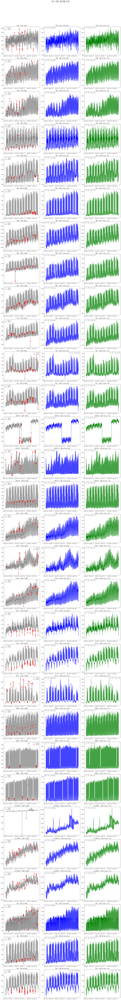

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# 1. 데이터 로드 및 병합
train = pd.read_csv('dataset/train.csv', encoding='utf-8')
bi = pd.read_csv('dataset/building_info.csv', encoding='utf-8')
merged_df = pd.merge(train, bi[['건물번호', '건물유형']], on='건물번호', how='left')
merged_df['전력소비량(kWh)'] = pd.to_numeric(merged_df['전력소비량(kWh)'], errors='coerce')
merged_df['일시'] = pd.to_datetime(merged_df['일시'], format='%Y%m%d %H', errors='coerce')

# 2. 건물유형별 보간
building_types = merged_df['건물유형'].dropna().unique()
all_time_only_dfs = {}
all_time_ffill_dfs = {}

for btype in building_types:
    type_df = merged_df[merged_df['건물유형'] == btype].copy()
    time_only_dfs = []
    time_ffill_dfs = []

    for bid, group in type_df.groupby('건물번호'):
        group = group.sort_values('일시').set_index('일시').asfreq('h')

        # 너무 결측이 많거나 데이터 부족하면 skip
        if group['전력소비량(kWh)'].isna().mean() > 0.2 or len(group) < 48:
            continue

        try:
            # STL 분해로 이상치 탐지
            stl = STL(group['전력소비량(kWh)'], period=24, robust=True)
            result = stl.fit()
            resid = result.resid
            threshold = 3 * resid.std()
            is_outlier = abs(resid) > threshold

            # 이상치 마스킹
            group['보간대상'] = group['전력소비량(kWh)'].copy()
            group.loc[is_outlier, '보간대상'] = np.nan

            # (A) 시간 기반 보간만
            A = group.copy()
            A['보간결과'] = A['보간대상'].interpolate(method='time')
            A = A.reset_index()
            A['건물번호'] = bid
            A['건물유형'] = btype
            time_only_dfs.append(A)

            # (B) 시간 + ffill + bfill
            B = group.copy()
            B['보간결과'] = B['보간대상'].interpolate(method='time').ffill().bfill()
            B = B.reset_index()
            B['건물번호'] = bid
            B['건물유형'] = btype
            time_ffill_dfs.append(B)

        except Exception:
            continue

    all_time_only_dfs[btype] = time_only_dfs
    all_time_ffill_dfs[btype] = time_ffill_dfs

# 3. 시각화 (각 건물유형당 최대 3개 건물)
fig_rows = sum(len(dfs[:3]) for dfs in all_time_only_dfs.values())
fig, axes = plt.subplots(fig_rows, 3, figsize=(18, 5 * fig_rows))
fig.suptitle("STL 기반 보간법 비교", fontsize=20)

row = 0
for btype in building_types:
    original_df = merged_df[merged_df['건물유형'] == btype]
    sample_dfs = all_time_only_dfs[btype][:3]
    sample_ffill_dfs = all_time_ffill_dfs[btype][:3]

    for i in range(len(sample_dfs)):
        bid = sample_dfs[i]['건물번호'].iloc[0]

        original = original_df[original_df['건물번호'] == bid].sort_values('일시')
        time_only = sample_dfs[i].sort_values('일시')
        time_ffill = sample_ffill_dfs[i].sort_values('일시')

        # STL 이상치 기준 마스킹
        original_stl = original.set_index('일시').asfreq('h')
        stl = STL(original_stl['전력소비량(kWh)'], period=24, robust=True).fit()
        resid = stl.resid
        threshold = 3 * resid.std()
        is_outlier = abs(resid) > threshold
        outlier_times = resid.index[is_outlier]

        # 시각화 - 이상치 scatter 시 안전하게
        axes[row, 0].plot(original['일시'], original['전력소비량(kWh)'], label='Original', color='gray')
        axes[row, 0].scatter(outlier_times, original_stl.loc[outlier_times, '전력소비량(kWh)'],
                     color='red', label='Outliers', zorder=3)
        axes[row, 0].set_title(f"{btype} - 건물 {bid} (원본)")
        axes[row, 0].legend()

        # 2. 시간 기반 보간
        axes[row, 1].plot(time_only['일시'], time_only['보간결과'], color='blue', label='STL + Time Interp')
        axes[row, 1].set_title(f"{btype} - 건물 {bid} (Time Only)")
        axes[row, 1].legend()

        # 3. 시간 + ffill + bfill
        axes[row, 2].plot(time_ffill['일시'], time_ffill['보간결과'], color='green', label='STL + Time + Fill')
        axes[row, 2].set_title(f"{btype} - 건물 {bid} (Time + Fill)")
        axes[row, 2].legend()

        row += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()
